<a href="https://colab.research.google.com/github/Robocon-2-0-2-1/Ball_dataset/blob/main/Copy_of_ball_model_train.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import zipfile
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
!ls  '/content/drive/My Drive/Dataset/ROI_images'

annotations  JPEG_Images


In [7]:
import shutil
import os, sys, random
import xml.etree.ElementTree as ET
from glob import glob
import pandas as pd
from shutil import copyfile
import pandas as pd
from sklearn import preprocessing, model_selection
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import patches
import numpy as np
import os

In [ ]:
annotations = sorted(glob('/content/drive/My Drive/Dataset/ROI_images/annotations/*.xml'))

df = []
cnt = 0
for file in annotations:

  prev_filename = file.split('/')[-1].split('.')[0] + '.jpg'
  filename = str(cnt) + '.jpg'
  row = []
  parsedXML = ET.parse(file)
  for node in parsedXML.getroot().iter('object'):
    blood_cells = node.find('name').text
    xmin = int(node.find('bndbox/xmin').text)
    xmax = int(node.find('bndbox/xmax').text)
    ymin = int(node.find('bndbox/ymin').text)
    ymax = int(node.find('bndbox/ymax').text)

    row = [prev_filename, filename, blood_cells, xmin, xmax, ymin, ymax]
    df.append(row)
  cnt += 1

data = pd.DataFrame(df, columns=['prev_filename', 'filename', 'cell_type', 'xmin', 'xmax', 'ymin', 'ymax'])

data[['prev_filename','filename', 'cell_type', 'xmin', 'xmax', 'ymin', 'ymax']].to_csv('/content/ball_detection.csv', index=False)

In [ ]:
img_width = 1280
img_height = 720

def width(df):
  return int(df.xmax - df.xmin)
def height(df):
  return int(df.ymax - df.ymin)
def x_center(df):
  return int(df.xmin + (df.width/2))
def y_center(df):
  return int(df.ymin + (df.height/2))
def w_norm(df):
  return df/img_width
def h_norm(df):
  return df/img_height

df = pd.read_csv('/content/ball_detection.csv')

le = preprocessing.LabelEncoder()
le.fit(df['cell_type'])
print(le.classes_)
labels = le.transform(df['cell_type'])
df['labels'] = labels

df['width'] = df.apply(width, axis=1)
df['height'] = df.apply(height, axis=1)

df['x_center'] = df.apply(x_center, axis=1)
df['y_center'] = df.apply(y_center, axis=1)

df['x_center_norm'] = df['x_center'].apply(w_norm)
df['width_norm'] = df['width'].apply(w_norm)

df['y_center_norm'] = df['y_center'].apply(h_norm)
df['height_norm'] = df['height'].apply(h_norm)

df.head(30)

['ball']


,prev_filename,filename,cell_type,xmin,xmax,ymin,ymax,labels,width,height,x_center,y_center,x_center_norm,width_norm,y_center_norm,height_norm
0,img-00000.jpg,0.jpg,ball,753,800,451,505,0,47,54,776,478,0.606250,0.036719,0.663889,0.075000
1,img-00001.jpg,1.jpg,ball,755,803,445,500,0,48,55,779,472,0.608594,0.037500,0.655556,0.076389
2,img-00002.jpg,2.jpg,ball,758,809,430,489,0,51,59,783,459,0.611719,0.039844,0.637500,0.081944
3,img-00003.jpg,3.jpg,ball,763,815,410,470,0,52,60,789,440,0.616406,0.040625,0.611111,0.083333
4,img-00004.jpg,4.jpg,ball,770,820,390,447,0,50,57,795,418,0.621094,0.039062,0.580556,0.079167
5,img-00005.jpg,5.jpg,ball,774,823,368,425,0,49,57,798,396,0.623437,0.038281,0.550000,0.079167
6,img-00006.jpg,6.jpg,ball,778,829,344,403,0,51,59,803,373,0.627344,0.039844,0.518056,0.081944
7,img-00007.jpg,7.jpg,ball,784,838,320,382,0,54,62,811,351,0.633594,0.042188,0.487500,0.086111
8,img-00008.jpg,8.jpg,ball,798,852,297,359,0,54,62,825,328,0.644531,0.042188,0.455556,0.086111
9,img-00009.jpg,9.jpg,ball,804,859,275,338,0,55,63,831,306,0.649219,0.042969,0.425000,0.087500


In [ ]:
df_train, df_valid = model_selection.train_test_split(df, test_size=0.1, random_state=13, shuffle=True)
print(df_train.shape, df_valid.shape)

(1359, 16) (152, 16)


In [ ]:
os.mkdir('/content/bcc/')
os.mkdir('/content/bcc/images/')
os.mkdir('/content/bcc/images/train/')
os.mkdir('/content/bcc/images/valid/')

os.mkdir('/content/bcc/labels/')
os.mkdir('/content/bcc/labels/train/')
os.mkdir('/content/bcc/labels/valid/')

In [ ]:
def segregate_data(df, img_path, label_path, train_img_path, train_label_path):
  filenames = []
  for filename in df.filename:
    filenames.append(filename)
  filenames = set(filenames)
  
  for filename in filenames:
    yolo_list = []

    for _,row in df[df.filename == filename].iterrows():
      yolo_list.append([row.labels, row.x_center_norm, row.y_center_norm, row.width_norm, row.height_norm])

    yolo_list = np.array(yolo_list)
    txt_filename = os.path.join(train_label_path,str(row.prev_filename.split('.')[0])+".txt")
    # Save the .img & .txt files to the corresponding train and validation folders
    np.savetxt(txt_filename, yolo_list, fmt=["%d", "%f", "%f", "%f", "%f"])
    shutil.copyfile(os.path.join(img_path,row.prev_filename), os.path.join(train_img_path,row.prev_filename))

In [ ]:
!ls bcc

images	labels


In [ ]:
%%time
src_img_path = "/content/drive/My Drive/Dataset/ROI_images/JPEG_Images/"
src_label_path = "/content/drive/My Drive/Dataset/ROI_images/annotations/"

train_img_path = "/content/bcc/images/train"
train_label_path = "/content/bcc/labels/train"

valid_img_path = "/content/bcc/images/valid"
valid_label_path = "/content/bcc/labels/valid"
print('.')
segregate_data(df_train, src_img_path, src_label_path, train_img_path, train_label_path)
segregate_data(df_valid, src_img_path, src_label_path, valid_img_path, valid_label_path)

.
CPU times: user 3.14 s, sys: 892 ms, total: 4.03 s
Wall time: 8min 19s


In [ ]:
try:
  shutil.rmtree('/content/bcc/images/train/.ipynb_checkpoints')
except FileNotFoundError:
  pass

try:
  shutil.rmtree('/content/bcc/images/valid/.ipynb_checkpoints')
except FileNotFoundError:
  pass

try:
  shutil.rmtree('/content/bcc/labels/train/.ipynb_checkpoints')
except FileNotFoundError:
  pass

try:
  shutil.rmtree('/content/bcc/labels/valid/.ipynb_checkpoints')
except FileNotFoundError:
  pass

print("No. of Training images", len(os.listdir('/content/bcc/images/train')))
print("No. of Training labels", len(os.listdir('/content/bcc/labels/train')))

print("No. of valid images", len(os.listdir('/content/bcc/images/valid')))
print("No. of valid labels", len(os.listdir('/content/bcc/labels/valid')))

No. of Training images 1359
No. of Training labels 1359
No. of valid images 152
No. of valid labels 152


In [ ]:
!mkdir -p '/content/drive/My Drive/Machine Learning Projects/YOLO/'
!cp -r '/content/bcc' '/content/drive/My Drive/Machine Learning Projects/YOLO/'

In [3]:
!git clone  'https://github.com/ultralytics/yolov5.git'

Cloning into 'yolov5'...
remote: Enumerating objects: 17, done.
remote: Counting objects: 100% (17/17), done.
remote: Compressing objects: 100% (13/13), done.
remote: Total 2700 (delta 5), reused 11 (delta 4), pack-reused 2683
Receiving objects: 100% (2700/2700), 5.45 MiB | 17.57 MiB/s, done.
Resolving deltas: 100% (1777/1777), done.


In [4]:
!pip install -qr '/content/yolov5/requirements.txt'  # install dependencies

     |████████████████████████████████| 276kB 4.5MB/s 


In [5]:
!echo -e 'train: /content/bcc/images/train\nval: /content/bcc/images/valid\n\nnc: 1\nnames: ['Ball']' >> bcc.yaml
!cat 'bcc.yaml'

train: /content/bcc/images/train
val: /content/bcc/images/valid

nc: 1
names: [Ball]


In [8]:
shutil.copyfile('/content/bcc.yaml', '/content/yolov5/bcc.yaml')

'/content/yolov5/bcc.yaml'

In [9]:
!sed -i 's/nc: 80/nc: 1/g' ./yolov5/models/yolov5m.yaml

In [ ]:
%%time

!python yolov5/train.py --img 1280 --batch 8 --epochs 100 --data bcc.yaml --cfg models/yolov5m.yaml --name BCCM

Using CUDA device0 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', total_memory=16280MB)

Namespace(adam=False, batch_size=8, bucket='', cache_images=False, cfg='./yolov5/models/yolov5m.yaml', data='bcc.yaml', device='', epochs=100, evolve=False, global_rank=-1, hyp='./yolov5/data/hyp.scratch.yaml', image_weights=False, img_size=[1280, 1280], local_rank=-1, logdir='runs/', multi_scale=False, name='BCCM', noautoanchor=False, nosave=False, notest=False, rect=False, resume=False, single_cls=False, sync_bn=False, total_batch_size=8, weights='yolov5s.pt', workers=8, world_size=1)
Start Tensorboard with "tensorboard --logdir runs/", view at http://localhost:6006/
2020-10-13 06:10:34.687841: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
Hyperparameters {'lr0': 0.01, 'lrf': 0.2, 'momentum': 0.937, 'weight_decay': 0.0005, 'warmup_epochs': 3.0, 'warmup_momentum': 0.8, 'warmup_bias_lr': 0.1, 'box': 0.05, 'cls': 0.5, 'cls_p

In [ ]:
# Start tensorboard (optional)
%load_ext tensorboard
%tensorboard --logdir runs/

<IPython.core.display.Javascript object>

In [10]:
!python yolov5/detect.py --source '/content/drive/My Drive/Throwing videos/WIN_20201007_12_08_32_Pro.mp4' --weights '/content/drive/My Drive/BallTrainingModel/runs/exp0_BCCM/weights/best.pt' --output '/content/inference/output'

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=640, iou_thres=0.5, output='/content/inference/output', save_txt=False, source='/content/drive/My Drive/Throwing videos/WIN_20201007_12_08_32_Pro.mp4', update=False, view_img=False, weights=['/content/drive/My Drive/BallTrainingModel/runs/exp0_BCCM/weights/best.pt'])
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

Fusing layers... 
Model Summary: 188 layers, 2.14686e+07 parameters, 0 gradients
video 1/1 (1/72) /content/drive/My Drive/Throwing videos/WIN_20201007_12_08_32_Pro.mp4: 384x640 Done. (0.022s)
video 1/1 (2/72) /content/drive/My Drive/Throwing videos/WIN_20201007_12_08_32_Pro.mp4: 384x640 Done. (0.017s)
video 1/1 (3/72) /content/drive/My Drive/Throwing videos/WIN_20201007_12_08_32_Pro.mp4: 384x640 Done. (0.018s)
video 1/1 (4/72) /content/drive/My Drive/Throwing videos/WIN_20201007_12_08_32_Pro.mp4: 384x640 Done. (0.017s)
video 1/1 (5/72) /content/drive

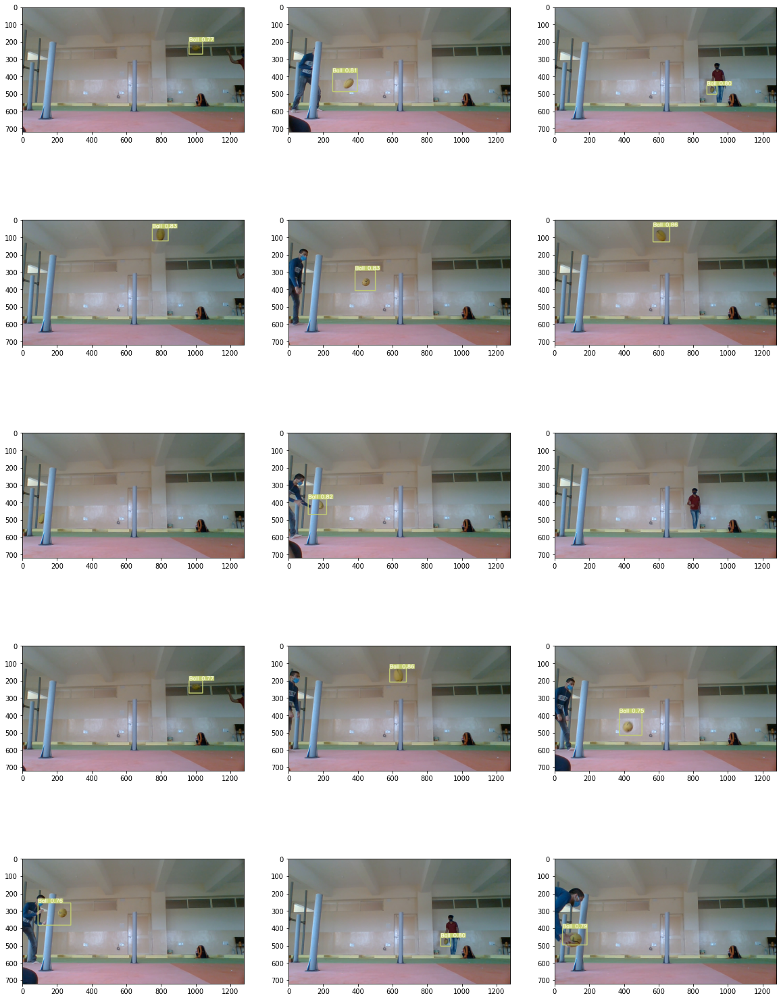

In [ ]:
from glob import glob
import matplotlib.pyplot as plt
import numpy as np

disp_images = glob('/content/inference/output/*')
fig=plt.figure(figsize=(20, 28))
columns = 3
rows = 5
for i in range(1, columns*rows +1):
    img = np.random.choice(disp_images)
    img = plt.imread(img)
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
plt.show()

In [ ]:
output = !python yolov5/detect.py --source /content/bcc/images/valid/img_00000.jpg --weights '/content/runs/exp0_BCCM/weights/best_BCCM.pt'
print(output)

["Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=640, iou_thres=0.5, output='inference/output', save_txt=False, source='/content/bcc/images/valid/img_00000.jpg', update=False, view_img=False, weights=['/content/runs/exp0_BCCM/weights/best_BCCM.pt'])", "Using CUDA device0 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', total_memory=16280MB)", '', 'Traceback (most recent call last):', '  File "yolov5/detect.py", line 171, in <module>', '    detect()', '  File "yolov5/detect.py", line 35, in detect', '    model = attempt_load(weights, map_location=device)  # load FP32 model', '  File "/content/yolov5/models/experimental.py", line 137, in attempt_load', "    model.append(torch.load(w, map_location=map_location)['model'].float().fuse().eval())  # load FP32 model", '  File "/usr/local/lib/python3.6/dist-packages/torch/serialization.py", line 571, in load', "    with _open_file_like(f, 'rb') as opened_file:", '  File "/usr/local/lib/python3.6

In [ ]:
from google.colab import drive
drive.mount('/content/drive/My Drive/BallTrainingModel')

ValueError: ignored

In [ ]:
!cp -r '/content/runs' '/content/drive/My Drive/BallTrainingModel/'

In [ ]:
!cp -r '/content/ball_detection.csv' '/content/drive/My Drive/BallTrainingModel/'

In [ ]:
!cp -r '/content/yolov5s.pt' '/content/drive/My Drive/BallTrainingModel/'

In [ ]:
!cp -r '/content/inference' '/content/drive/My Drive/BallTrainingModel/'